In [46]:
import sys
import random
import os
import xgi
import numpy as np
import iisignature as iis
import matplotlib.pyplot as plt
import gudhi
from gudhi import plot_persistence_diagram
from gudhi import plot_persistence_density
from gtda.homology import VietorisRipsPersistence
from gtda.homology import FlagserPersistence
from gtda.diagrams import PersistenceEntropy
from gtda.diagrams import Amplitude
from gudhi.representations.vector_methods import Entropy
from gtda.diagrams import PairwiseDistance
from gtda.plotting import plot_diagram
import numpy.random as rd
import gudhi.representations
%run FUNCTIONS.ipynb
%run Kuramoto_new_def.ipynb

In [47]:
def draw_matrices(time_series,length):
    LIST=list()
    l=time_series.shape[0]
    N=time_series.shape[1]
    h=np.int64(np.modf(l/length)[1])
    sub_h=np.int64(np.ceil(h/2))
    for i in range(1,length+1):
        sub_ts=time_series[(i*h-sub_h):(i*h+sub_h),:]
        L=lead_matrix_1(sub_ts)
        LIST.append(L)
    fig, axs = plt.subplots(8, np.int64(np.ceil(length/8)), figsize=(20,17), sharex=True, sharey=True)

    for i in range(length):
    
        ax = axs.flatten()
    
        pos=ax[i].matshow(LIST[i], alpha=0.9, cmap="Blues")
        pos
        fig.colorbar(pos,ax=ax[i])

Unnamed SimplicialComplex with 3 nodes and 3 simplices


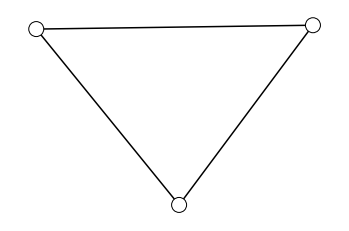

In [48]:
N = 3
ps = [1.0, 0]

S = xgi.random_simplicial_complex(N, ps, seed=1)
print(S)

tag_sc = f"random_simplicial_complex_N_{N}_ps_{ps}"
xgi.draw(S)

k1_avg_sc = S.nodes.degree(order=1).mean()
k2_avg_sc = S.nodes.degree(order=2).mean()
links_sc = S.edges.filterby("order", 1).members()
triangles_sc = S.edges.filterby("order", 2).members()

In [49]:
 # fix seed for reproducibility
#omega = np.random.normal(size=N) # initial frequencies
omega=np.load("Omega_1.npy")
# integration
t_end = 1000
dt =0.1

# choose to simulate on hypergraph or simplicial
# created earlier

In [50]:


tag_net = tag_sc
structure=S
args = {
    "links": links_sc,
    "triangles": triangles_sc,
    "k1_avg": k1_avg_sc,
    "k2_avg": k2_avg_sc,
}

k1=0.8
k2=0
ic = "random" # initial condition type, see docs for other possible ones
noise = 5e-1 # noise strength
p2 = None # only used for rand2clust

psi_init = generate_initial_conditions(N, kind=ic, noise=noise, p2=p2, seed=None)
    
thetas, times = simulate_kuramoto(structure,k1,k2,omega=omega,theta_0=psi_init,t_end=t_end,dt=dt,rhs=rhs_lucas,**args)
tag_params = f"k1_{k1:.2f}_k2_{k2:.2f}_ic_{ic}"
tag = f"{tag_net}_{tag_params}"
np.savez(f"{tag}",thetas=thetas,times=times,N=N,ps=ps,kind="sc",k1=k1,k2=k2,omega=omega,ic=ic,noise=noise,t_end=t_end,dt=dt,model="lucas")
time_series=(np.sin(thetas)).T

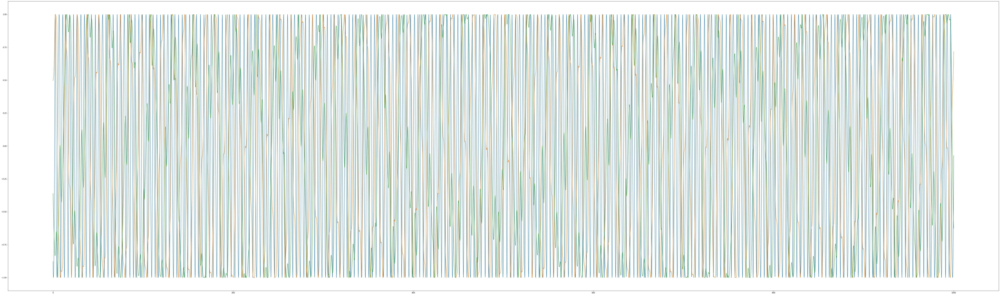

In [51]:
plt.figure(figsize=(100,30))
plt.plot(times,np.sin(thetas[0,:]))
plt.plot(times,np.sin(thetas[1,:]))
plt.plot(times,np.sin(thetas[2,:]))
plt.show()

In [52]:
# Curves
length=50
indifference_value=0

en_cl,am_cl=en_am_cl_sliding(time_series,length)
hyp_h,en_1_h,en_0_h=en_h_hyp_v_sliding(time_series,length,indifference_value)
viol=viol_v_sliding(time_series,length,indifference_value)
hyp_cofl,en_1_cofl,en_0_cofl=en_h_hyp_v_sliding_cofl(time_series,length) 
interval=range(0,1000)[:-2]
en_i,am_i=am_en_i_mod(time_series,interval)

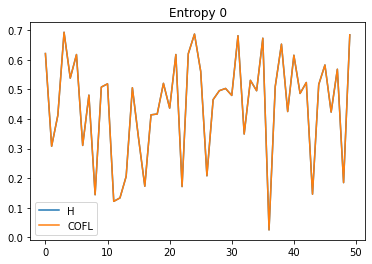

In [54]:
plt.figure()
plt.title("Entropy 0")
plt.plot(range(length),en_0_h)
plt.plot(range(length),en_0_cofl)
plt.legend(["H","COFL"])
plt.show()

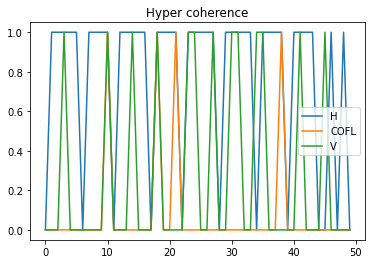

In [56]:
plt.figure()
plt.title("Hyper coherence")
plt.plot(range(length),hyp_h)
plt.plot(range(length),hyp_cofl)
plt.plot(range(length),viol)
plt.legend(["H","COFL","V"])
plt.show()

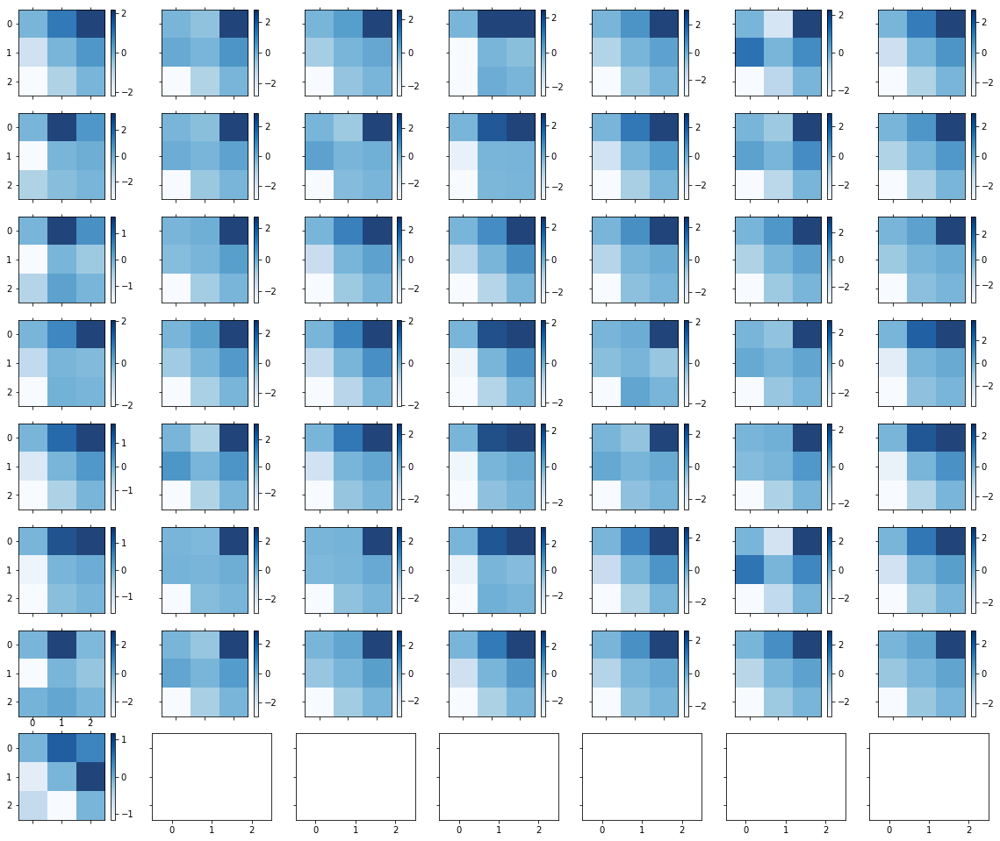

In [59]:
draw_matrices(time_series,50)

In [60]:
tag_net = tag_sc
structure=S
args = {
    "links": links_sc,
    "triangles": triangles_sc,
    "k1_avg": k1_avg_sc,
    "k2_avg": k2_avg_sc,
}

k1=2
k2=0
ic = "random" # initial condition type, see docs for other possible ones
noise = 5e-1 # noise strength
p2 = None # only used for rand2clust

psi_init = generate_initial_conditions(N, kind=ic, noise=noise, p2=p2, seed=None)
    
thetas, times = simulate_kuramoto(structure,k1,k2,omega=omega,theta_0=psi_init,t_end=t_end,dt=dt,rhs=rhs_lucas,**args)
tag_params = f"k1_{k1:.2f}_k2_{k2:.2f}_ic_{ic}"
tag = f"{tag_net}_{tag_params}"
np.savez(f"{tag}",thetas=thetas,times=times,N=N,ps=ps,kind="sc",k1=k1,k2=k2,omega=omega,ic=ic,noise=noise,t_end=t_end,dt=dt,model="lucas")
time_series=(np.sin(thetas)).T

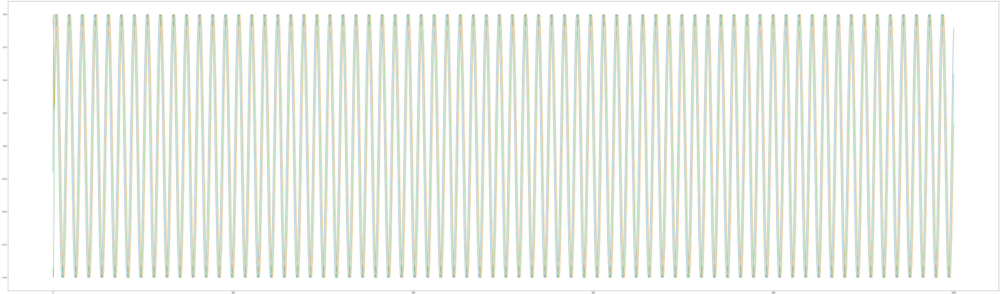

In [61]:
plt.figure(figsize=(100,30))
plt.plot(times,np.sin(thetas[0,:]))
plt.plot(times,np.sin(thetas[1,:]))
plt.plot(times,np.sin(thetas[2,:]))
plt.show()

In [62]:
# Curves
length=50
indifference_value=0

en_cl,am_cl=en_am_cl_sliding(time_series,length)
hyp_h,en_1_h,en_0_h=en_h_hyp_v_sliding(time_series,length,indifference_value)
viol=viol_v_sliding(time_series,length,indifference_value)
hyp_cofl,en_1_cofl,en_0_cofl=en_h_hyp_v_sliding_cofl(time_series,length) 
interval=range(0,1000)[:-2]
en_i,am_i=am_en_i_mod(time_series,interval)

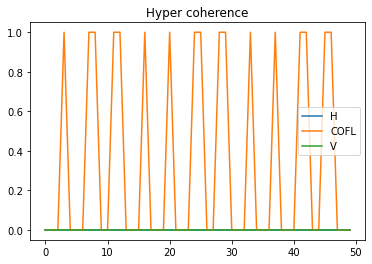

In [65]:
plt.figure()
plt.title("Hyper coherence")
plt.plot(range(length),hyp_h)
plt.plot(range(length),hyp_cofl)
plt.plot(range(length),viol)
plt.legend(["H","COFL","V"])
plt.show()

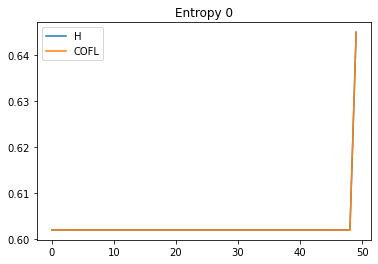

In [66]:
plt.figure()
plt.title("Entropy 0")
plt.plot(range(length),en_0_h)
plt.plot(range(length),en_0_cofl)
plt.legend(["H","COFL"])
plt.show()

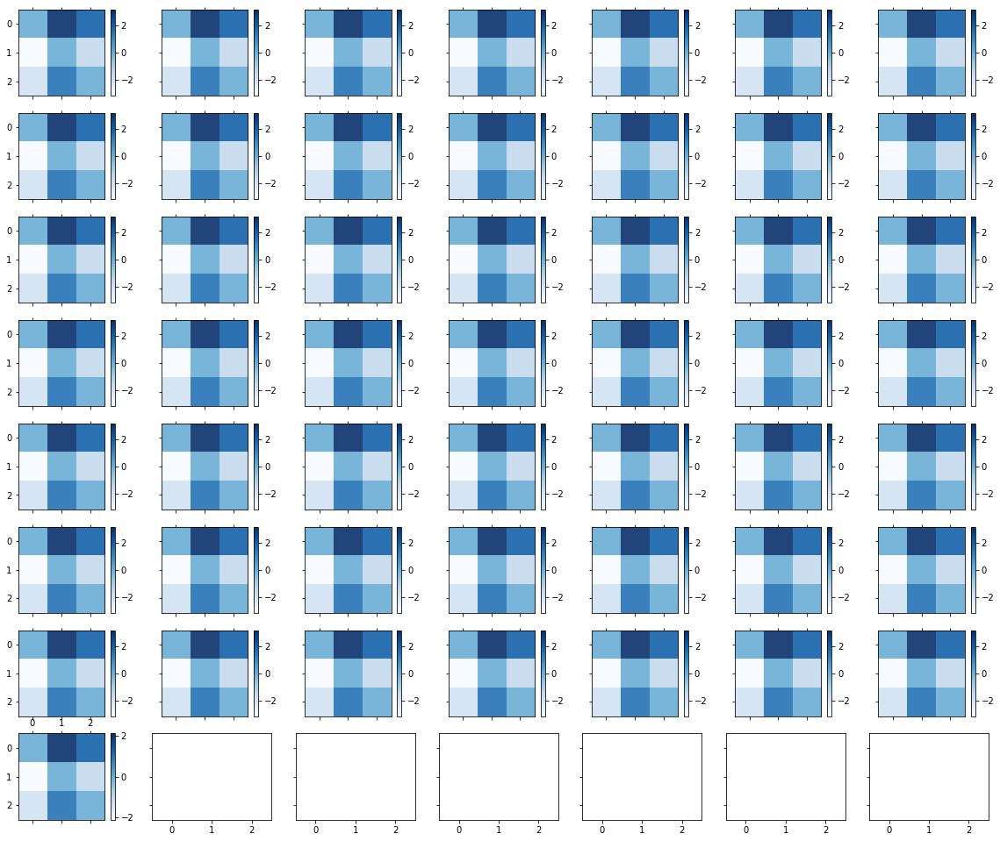

In [69]:
draw_matrices(time_series,50)

In [70]:
tag_net = tag_sc
structure=S
args = {
    "links": links_sc,
    "triangles": triangles_sc,
    "k1_avg": k1_avg_sc,
    "k2_avg": k2_avg_sc,
}

k1=1.4
k2=0
ic = "random" # initial condition type, see docs for other possible ones
noise = 5e-1 # noise strength
p2 = None # only used for rand2clust

psi_init = generate_initial_conditions(N, kind=ic, noise=noise, p2=p2, seed=None)
    
thetas, times = simulate_kuramoto(structure,k1,k2,omega=omega,theta_0=psi_init,t_end=t_end,dt=dt,rhs=rhs_lucas,**args)
tag_params = f"k1_{k1:.2f}_k2_{k2:.2f}_ic_{ic}"
tag = f"{tag_net}_{tag_params}"
np.savez(f"{tag}",thetas=thetas,times=times,N=N,ps=ps,kind="sc",k1=k1,k2=k2,omega=omega,ic=ic,noise=noise,t_end=t_end,dt=dt,model="lucas")
time_series=(np.sin(thetas)).T

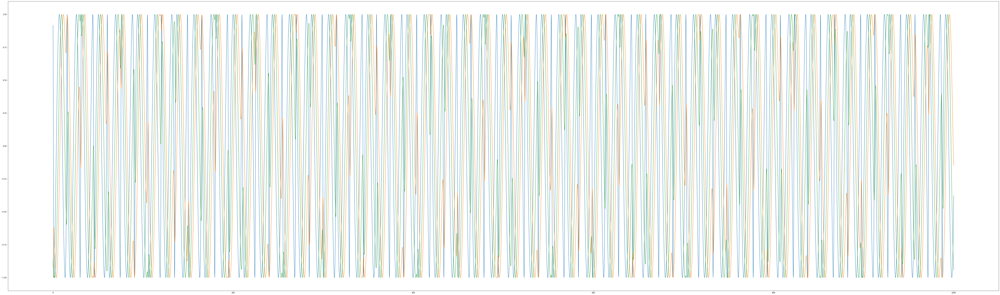

In [71]:
plt.figure(figsize=(100,30))
plt.plot(times,np.sin(thetas[0,:]))
plt.plot(times,np.sin(thetas[1,:]))
plt.plot(times,np.sin(thetas[2,:]))
plt.show()

In [72]:
# Curves
length=50
indifference_value=0

en_cl,am_cl=en_am_cl_sliding(time_series,length)
hyp_h,en_1_h,en_0_h=en_h_hyp_v_sliding(time_series,length,indifference_value)
viol=viol_v_sliding(time_series,length,indifference_value)
hyp_cofl,en_1_cofl,en_0_cofl=en_h_hyp_v_sliding_cofl(time_series,length) 
interval=range(0,1000)[:-2]
en_i,am_i=am_en_i_mod(time_series,interval)

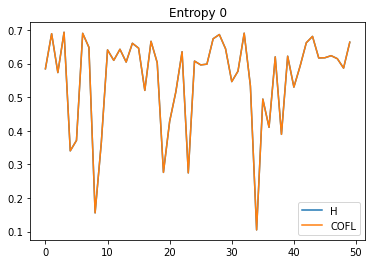

In [74]:
plt.figure()
plt.title("Entropy 0")
plt.plot(range(length),en_0_h)
plt.plot(range(length),en_0_cofl)
plt.legend(["H","COFL"])
plt.show()

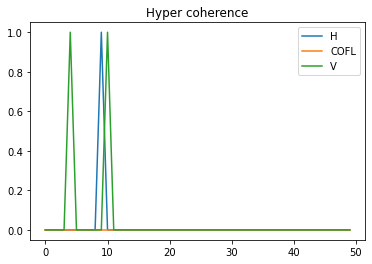

In [76]:
plt.figure()
plt.title("Hyper coherence")
plt.plot(range(length),hyp_h)
plt.plot(range(length),hyp_cofl)
plt.plot(range(length),viol)
plt.legend(["H","COFL","V"])
plt.show()

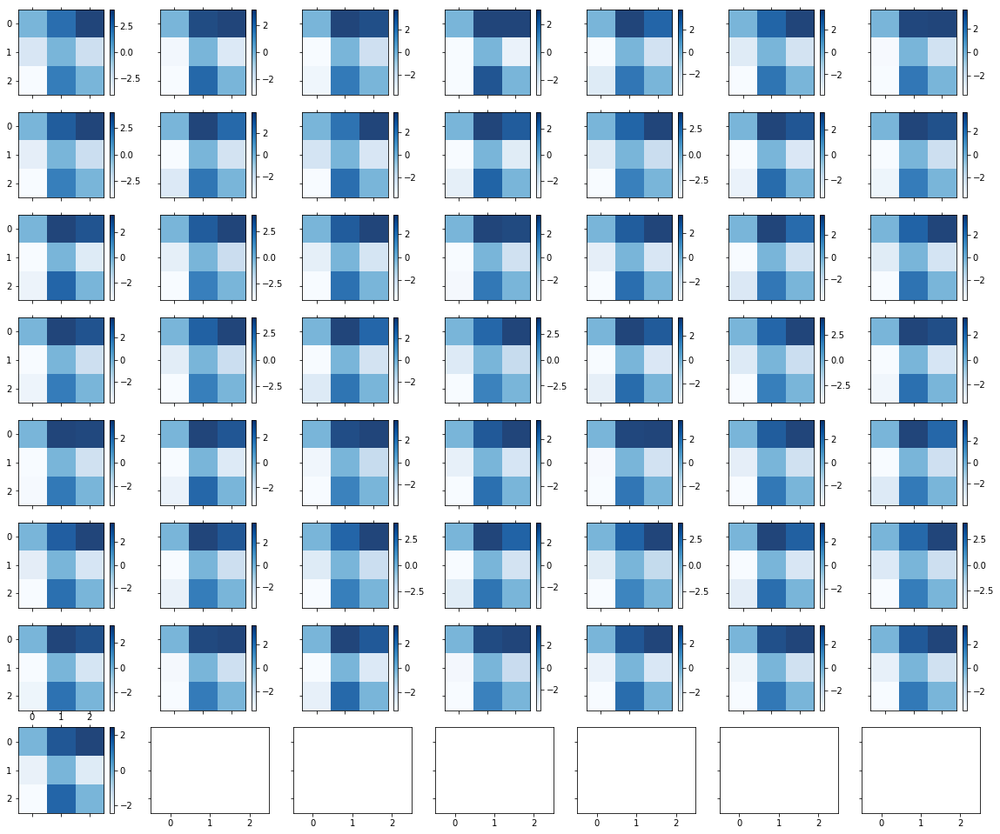

In [79]:
draw_matrices(time_series,50)

In [80]:
np.save("Omega_1",omega)